<left>
<table style="margin-top:0px; margin-left:0px;">
<tr>
  <td><img src="https://raw.githubusercontent.com/worm-portal/WORM-Figures/master/style/worm.png" alt="WORM" title="WORM" width=50/></td>
  <td><h1 style=font-size:30px>Serpentinization Activity</h1><h2>Answer Sheet</h2></td>
</tr>
</table>
</left>

In case you need it, here is a link to [the WORM database table](https://tinyurl.com/wormdb). It can be helpful for looking up mineral names. Descriptions of columns and their units can be found in the [WORM database documentation](https://worm-portal.asu.edu/docs/database/). 

---

### Activity: Serpentinization, continued!

<img src="https://www.le-comptoir-geologique.com/_media/img/small/telechargement-6-2-2.png" alt="enstatite" title="enstatite" width=50%/>

[Enstatite](https://www.mindat.org/min-1384.html). Image credit: Y. Vessely
<br/>

Forsterite can react with a pH 6 fluid to produce chrysotile and brucite. What happens if we change the Mg:Si ratio of the reactant mineral? Are different minerals produced? What happens to the pH of the fluid?

| Group | Mineral | Formula | Mg:Si | Reactive at surface conditions? | Product minerals | pH change? |
|-------|---------|---------|-------|---------------------------------|------------------|------------|
| olivine | forsterite | Mg2SiO4 | 2:1 | Yes | chrysotile, brucite | Big increase |
| orthopyroxine | enstatite | MgSiO3 | 1:1 | Yes | ??? | ??? |
| clinopyroxene | diopside | CaMgSi2O6 | 1:2 | No | ??? | ??? |

1. Explore what is predicted to happen to these serpentinizing endmember minerals when they are reacted with speciated pH 6 fluid.
    <ol type="a">
      <li>Can you uncover the blanks in the table?</li>
      <li>What can be said about Mg:Si in the types and abundance of product minerals?</li>
    </ol><br>
    
2. What happens when you react a rock made up of forsterite, enstatite, and diopside (each with ~0.33 mole fraction)?
---

### Answers to question 1 can be obtained by repeating the steps for forsterite (given in the introductory notebook) but replacing "forsterite" with "enstatite" or "diopside".

Product minerals for enstatite include chrysotile and talc. Big increase in pH.

Product minerals for diopside include tremolite (and several intermediate minerals). Big increase in pH.

### The answer to question 2 is shown below:

In [1]:
import aqequil

In [2]:
ae = aqequil.AqEquil(exclude_organics=True)

Loading Water-Organic-Rock-Microbe (WORM) thermodynamic databases...
Excluding ['organic_aq', 'organic_cr'] from column 'category_1'in wrm_data_latest.csv
wrm_data_latest.csv is now set as the active thermodynamic database.
Element database elements.csv is active.
Solid solution database solid_solutions.csv is active.
LogK database wrm_data_logk.csv is active.
Excluding ['organic_aq', 'organic_cr'] from column 'category_1'in wrm_data_logk.csv
LogK_S database wrm_data_logk_s.csv is active.
Excluding ['organic_aq', 'organic_cr'] from column 'category_1'in wrm_data_logk_s.csv
Loading thermodynamic database into pyCHNOSZ...


In [3]:
speciation = ae.speciate(input_filename="pH6-8_fluids.csv",
                         alter_options=[["antigorite", "Suppress"]],
                         )

The input file column 'logfO2' will be used to set sample redox state. If a another column is desired, set it manually using the redox_flag parameter.
Getting wrm_data_latest.csv ready. This will take a moment...
Using wrm_data_latest.csv to speciate pH6
Using wrm_data_latest.csv to speciate pH7
Using wrm_data_latest.csv to speciate pH8
Finished!


In [4]:
speciation.save("serp")

Saved as 'serp.speciation'


The notebook can be safely shut down or restarted and resumed from this point.

In [5]:
import aqequil
speciation = aqequil.load("serp")

Attempting to load serp.speciation ...
Loaded 'serp.speciation'


In [6]:
For = aqequil.Reactant(reactant_name="forsterite",
                             amount_remaining=1, # moles of mineral to react
                             f_rate_law='Relative rate equation', # forward rate law
                             f_eq1=0.33, # dXi(n)/dXi (mol/mol), the mole fraction of this mineral in the rock
                             b_rate_law="Partial equilibrium", # backward rate law
                             )

Ens = aqequil.Reactant(reactant_name="enstatite",
                             amount_remaining=1, # moles of mineral to react
                             f_rate_law='Relative rate equation', # forward rate law
                             f_eq1=0.33, # dXi(n)/dXi (mol/mol), the mole fraction of this mineral in the rock
                             b_rate_law="Partial equilibrium", # backward rate law
                             )

Dio = aqequil.Reactant(reactant_name="diopside",
                             amount_remaining=1, # moles of mineral to react
                             f_rate_law='Relative rate equation', # forward rate law
                             f_eq1=0.33, # dXi(n)/dXi (mol/mol), the mole fraction of this mineral in the rock
                             b_rate_law="Partial equilibrium", # backward rate law
                             )

# combine the mineral reactants in a list to prepare the reaction
r = aqequil.Prepare_Reaction(reactants=[For, Ens, Dio], write_tab=0)

In [7]:
speciation = aqequil.react(speciation, r)

Using wrm_data_latest.csv to react pH6
Using wrm_data_latest.csv to react pH7
Using wrm_data_latest.csv to react pH8


In [8]:
speciation.lookup('name')

Column(s) not found: ['name']


Sample
pH6
pH7
pH8


In [9]:
# get mass transfer data for a sample
m = speciation.mt("pH6")

## Answers

### Fill out the table:

Enstatite's product minerals are chrysotile and talc in a 1:1 ratio. Big pH increase.

Diopside's product minerals are tremolite (plus other minerals forming and disappearing during the reaction). Big pH increase.

---
### What can be said about Mg:Si in the types and abundance of product minerals?

- Enstatite has a 1:1 ratio of Mg:Si. The products it forms include 50% chrysotile [Mg3Si2O5(OH)4] and 50% talc [Mg3Si4O10(OH)2].

    - If you sum up the masses of Si and Mg in chrysotile and talc, the products still have a 1:1 ratio.
    - Plotting concentrations of dissolved elements reveals that dissolved Mg and Si dissolved also have a 1:1 ratio.

<br>

- Diopside has a 1:2 ratio of Mg:Si. The product it forms is tremolite [(Ca2Mg5)Si8O22(OH)2].

    - The product has a different ratio of Mg:Si than the reactant. It also has a different Ca:Si.

    - Plotting concentrations of dissolved elements reveals that Ca, Mg, and Si from diopside is entering solution as the reaction proceeds. Then tremolite starts to form, drawing Mg out of solution.

---

### What happens when you react a rock made up of forsterite, enstatite, and diopside (each with ~0.33 mole fraction)?

Results are shown below.

---

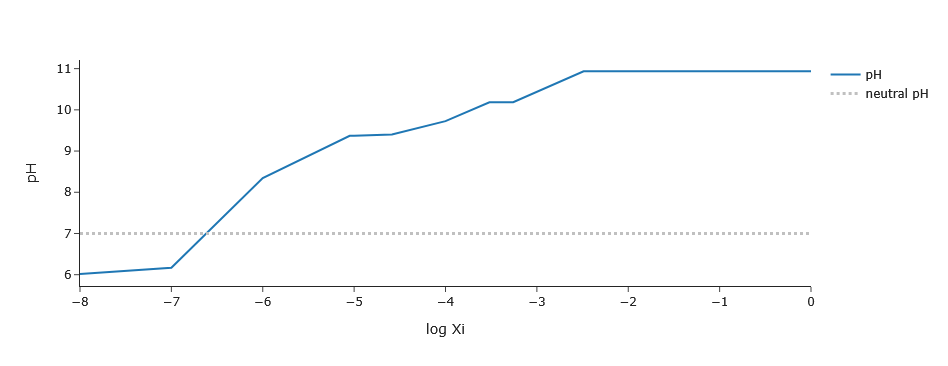

In [10]:
m.plot_pH()

Plot concentrations of dissolved elements as a function of reaction progress (Xi)

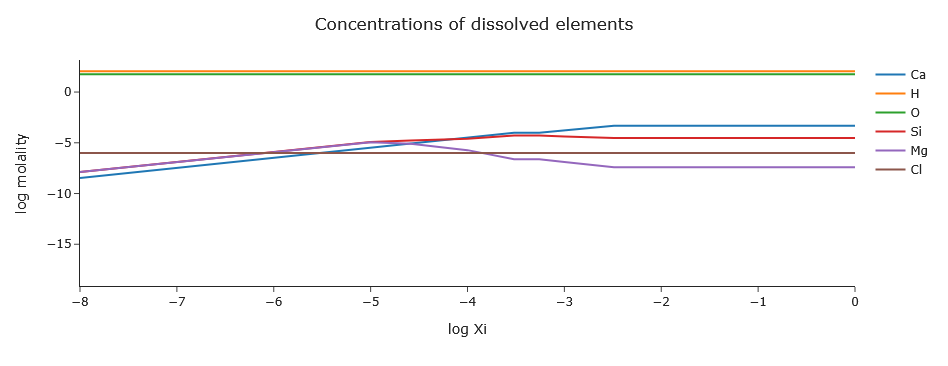

In [11]:
m.plot_elements(log=True)

Plot activity of aqueous basis species as a function of reaction progress (Xi)

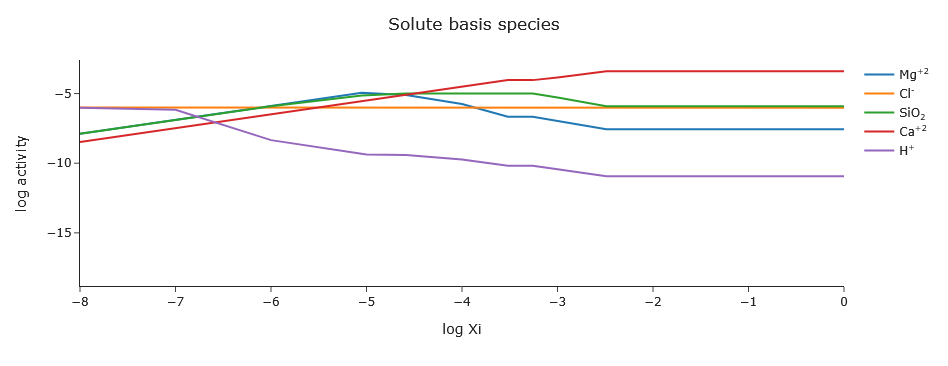

In [12]:
m.plot_aqueous_species(plot_basis=True)

Plot activity of non-basis aqueous species as a function of reaction progress (Xi)

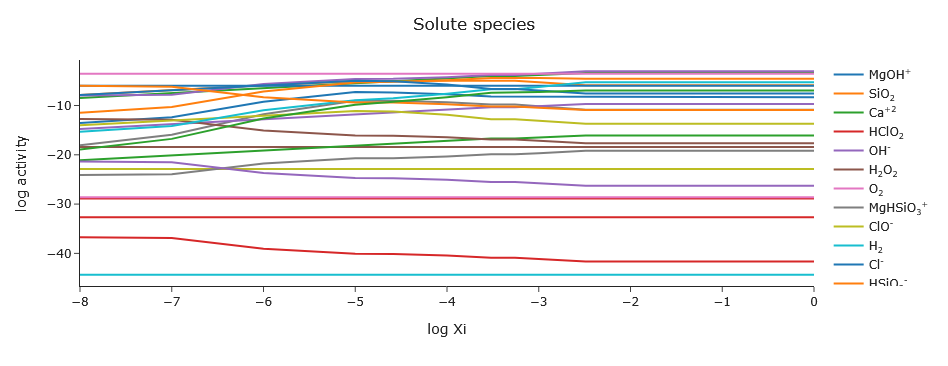

In [13]:
m.plot_aqueous_species(plot_basis=False)

Plot moles of product minerals as a function of reaction progress (Xi)

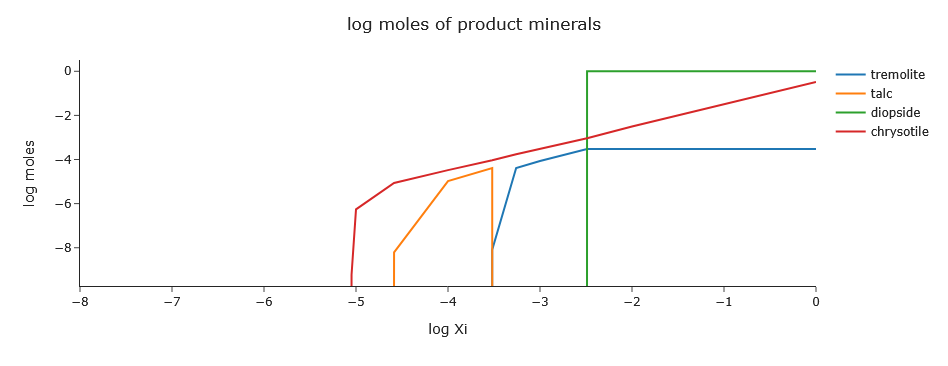

In [14]:
m.plot_product_minerals(show_reactant_minerals=False, log_y=True, y_type='mole')

Create an interactive reaction path diagram with desired species as x, y, and balance variables. (It might take a minute to load the plot.)

Once it is ready, hover your mouse over the plot to see more.

The red line and dots indicate the reaction path of the fluid. Open circles represent 'projections', where the point is above or below the plane in multidimensional space. Closed circles indicate points along the reaction path that are interacting with activity fields and/or saturation lines present in the diagram.

We recommend setting `calculate_projected_points=False` when you are visualizing a sample that has many elements (e.g., the Henry Clay Sterling Mine example). This is because calculating whether a point is projected involves looping through every permutation of x, y, and balance variables. The more elements present, the longer it takes to finish.

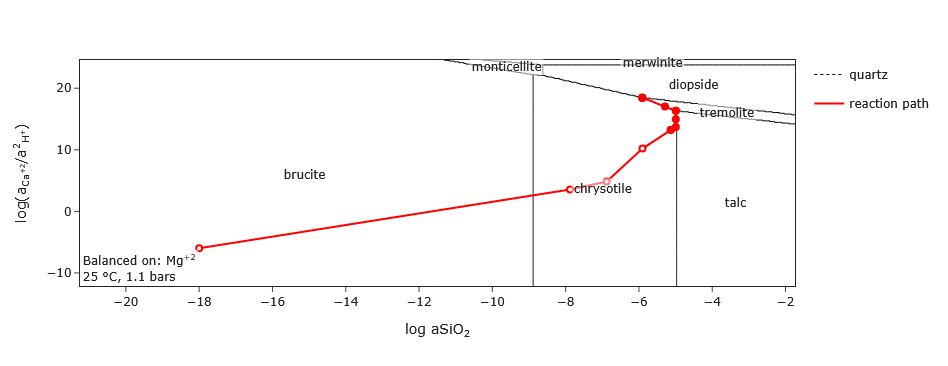

In [15]:
e = m.plot_reaction_paths(["SiO2","Ca+2","Mg+2"], # x, y, and balance variables
                          flip_xy=False, # flip variables on x and y axes?
                          res=300, # 300 calculations per axis. Higher is slower but makes smoother region lines
                          minerals_to_show=["quartz"], # ensure certain mineral saturation lines will appear
                          calculate_projected_points=True, # set to False if there are many elements in the system
                         )[0].show()

The next cell will plot reaction paths with all permutations of x, y, and balance variables. This might take a minute or more.

Running this cell is not recommended when you have many elements of the system (e.g., the Henry Clay Sterling acid mine drainage example). This is because there are too many permutations of x, y, and balance variables to plot in one notebook. The cell will probably never finish running! Instead, use the technique shown in the cell directly above to define x, y, and balance variables manually and skip the next cell.

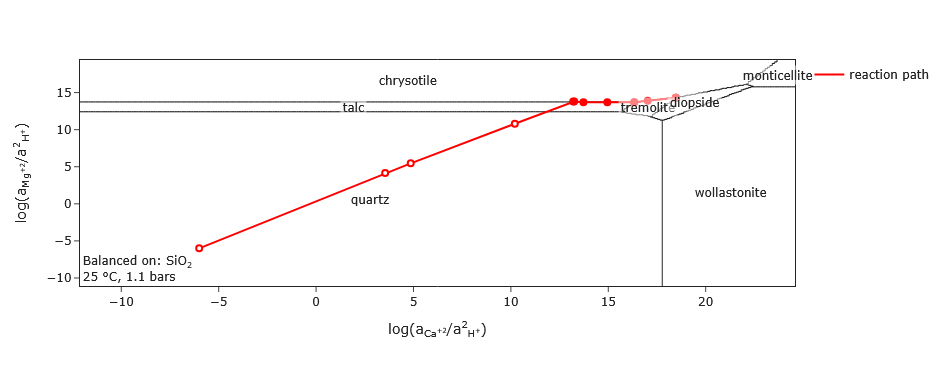

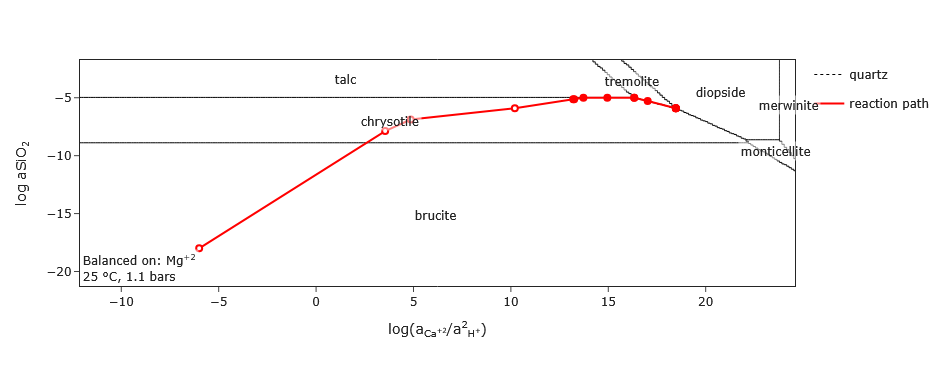

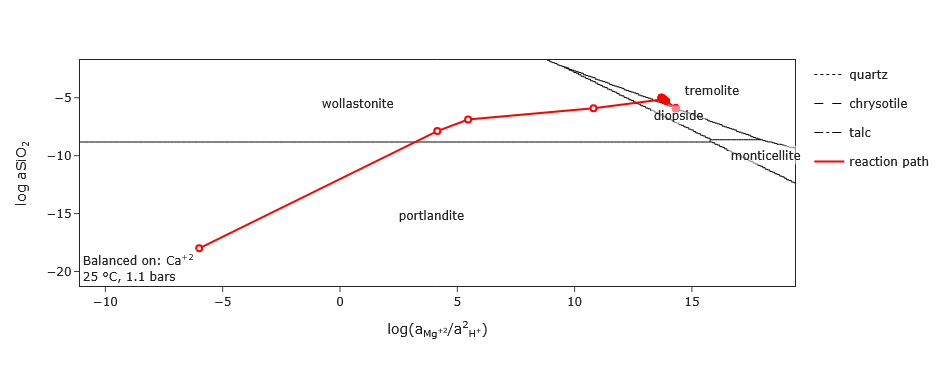

In [16]:
fig_list = m.plot_reaction_paths(path_margin=0.25, # amount of space around the reaction path
                                 res=300, # resolution of background mineral stability field
                                 flip_xy=False, # flip variables on x and y axes?
                                 plot_width=4, # in inches
                                 plot_height=3, # in inches
                                 minerals_to_show=["quartz"], # ensure certain mineral saturation lines will appear
                                 calculate_projected_points=True, # set to False if there are many elements in the system
                                )

_ = [fig.show() for fig in fig_list]

Plot mass contribution of a basis species across reaction progress (Xi).

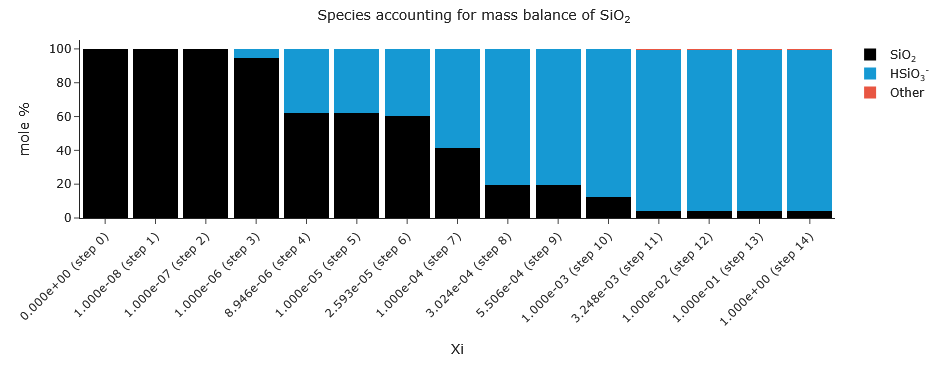

In [17]:
m.plot_mass_contribution("SiO2")

## Tables

Print a list of available tables.

In [18]:
m.print_tabs()

Table B1 Miscellaneous parameters I
Table B2 Miscellaneous parameters II
Table C1 Dissolved elements(molality)
Table C2 Dissolved elements(ppm: mg/kg.sol)
Table C3 Dissolved elements(molarity)
Table C4 Dissolved elements(ppm: mg/L)
Table D1 Solute basis species(total molality)
Table D2 Solute basis species(total ppm: mg/kg.sol)
Table D3 Solute basis species(total molarity)
Table D4 Solute basis species(total ppm: mg/L)
Table E1 Basis species(log true molality; log mole fraction for H2O  log fugacity for O2(g))
Table E2 Basis species(log activity; log fugacity for O2(g))
Table E3 Basis species(log activity coefficient)
Table J Moles of reactants destroyed/created
Table K Affinities of reactants (kcal)
Table P Moles of product minerals
Table Q Saturation indices of potential product phases
Table T Fugacities (bars)
Table W Overall mass and volume changes


Display Table J by copy-pasting its full name from the list above

In [19]:
m.tab["Table P Moles of product minerals"]

,Xi,t(days),chrysotile,talc,tremolite,diopside
0,0.000,0.000,None,None,None,None
1,1.0000E-08,0.000,None,None,None,None
2,1.0000E-07,0.000,None,None,None,None
3,1.0000E-06,0.000,None,None,None,None
4,8.9461E-06,0.000,5.9909E-10,None,None,None
5,1.0000E-05,0.000,5.4825E-07,None,None,None
6,2.5931E-05,0.000,8.6635E-06,6.1754E-09,None,None
7,1.0000E-04,0.000,3.2926E-05,1.0444E-05,None,None
8,3.0244E-04,0.000,9.2034E-05,4.0946E-05,8.1543E-09,None
9,5.5061E-04,0.000,1.7393E-04,0.000,4.0955E-05,None


#### Display Table D1 in the same way

In [20]:
m.tab["Table D1 Solute basis species(total molality)"]

,Xi,t(days),H+,Mg+2,Ca+2,Cl-,SiO2
0,0.000,0.000,9.9105E-07,1.0000E-18,1.0000E-18,1.0000E-06,1.0000E-18
1,1.0000E-08,0.000,9.5805E-07,1.3200E-08,3.3000E-09,1.0000E-06,1.3200E-08
2,1.0000E-07,0.000,6.6105E-07,1.3200E-07,3.3000E-08,1.0000E-06,1.3200E-07
3,1.0000E-06,0.000,-2.3089E-06,1.3200E-06,3.3000E-07,1.0000E-06,1.3200E-06
4,8.9461E-06,0.000,-2.8527E-05,1.1807E-05,2.9522E-06,1.0000E-06,1.1808E-05
5,1.0000E-05,0.000,-2.8719E-05,1.1555E-05,3.3000E-06,1.0000E-06,1.2104E-05
6,2.5931E-05,0.000,-3.2563E-05,8.2197E-06,8.5572E-06,1.0000E-06,1.6877E-05
7,1.0000E-04,0.000,-6.8788E-05,1.8897E-06,3.3000E-05,1.0000E-06,2.4372E-05
8,3.0244E-04,0.000,-1.9907E-04,2.4141E-07,9.9790E-05,1.0000E-06,5.1305E-05
9,5.5061E-04,0.000,-1.9907E-04,2.4141E-07,9.9791E-05,1.0000E-06,5.1305E-05


Display a table of the log activity of aqueous species at different values of Xi. The `.head()` means only the first five rows are displayed in the notebook.

In [21]:
m.aq_distribution_logact.head()

,Xi,MgOH+,SiO2,Ca+2,HClO2,OH-,H2O2,O2,MgHSiO3+,ClO-,...,HCl,ClO3-,HO2-,MgCl+,CaOH+,Mg+2,H+,CaHSiO3+,ClO2-,HClO
0,0.000000e+00,-23.6845,-18.0001,-18.0020,-36.6974,-7.9950,-18.4091,-3.5679,-38.3274,-22.8858,...,-12.7107,-28.6131,-24.0932,-24.1375,-24.8353,-18.0020,-6.0000,-38.5774,-32.6765,-21.3359
1,1.000000e-08,-13.5496,-7.8795,-8.4836,-36.7118,-7.9806,-18.4091,-3.5679,-18.0718,-22.8858,...,-12.7251,-28.6131,-24.0788,-14.0169,-15.3024,-7.8815,-6.0144,-18.9239,-32.6765,-21.3503
2,1.000000e-07,-12.3936,-6.8796,-7.4837,-36.8679,-7.8245,-18.4091,-3.5679,-15.9159,-22.8858,...,-12.8813,-28.6132,-23.9226,-13.0171,-14.1465,-6.8816,-6.1705,-16.7680,-32.6765,-21.5065
3,1.000000e-06,-9.2223,-5.9037,-6.4860,-39.0423,-5.6507,-18.4091,-3.5679,-11.7688,-22.8864,...,-15.0556,-28.6137,-21.7489,-12.0202,-10.9750,-5.8842,-8.3443,-12.6207,-32.6771,-23.6808
4,8.946060e-06,-7.2545,-5.1362,-5.5435,-40.0715,-4.6237,-18.4091,-3.5679,-9.0335,-22.8886,...,-16.0849,-28.6160,-20.7219,-11.0816,-9.0054,-4.9433,-9.3713,-9.8836,-32.6793,-24.7101


Documentation is available for any function by including `?` at the end of the function name. For instance, here is the documentation for the `AqEquil.Reactant` function used earlier in the notebook to define forsterite and fayalite as minerals to react with speciated fluids:

In [22]:
aqequil.Reactant?

Init signature:
aqequil.Reactant(
    reactant_name,
    reactant_type='Pure mineral',
    reactant_status='Reacting',
    amount_remaining=1,
    amount_destroyed=0,
    molar_volume=0,
    surface_area_option=0,
    surface_area_value=0,
    surface_area_factor=0,
    f_rate_law='Relative rate equation',
    f_eq1=1,
    f_eq2=0,
    f_eq3=0,
    b_rate_law='Partial equilibrium',
    b_eq1=1,
    b_eq2=0,
    b_eq3=0,
    special_reactant_dict={},
    hide_traceback=True,
)
Docstring:      <no docstring>
Init docstring:
Class used to define reactants for `Prepare_Reaction`.

Parameters
----------
reactant_name : str
    Name of the reactant.

reactant_type : str, default "Pure mineral"
    Reactant type. Valid types include:
    
    - Pure mineral
    - Solid solution
    - Special reactant
    - Aqueous species
    - Gas species
    - Generic ion exchanger

reactant_status : str, default "Reacting"
    Status of the reactant. Valid statuses include:
    
    - Reacting
    - Satura